In [1]:
import os
import json
import numpy as np
import pandas as pd
import librosa
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, classification_report
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

In [2]:
# Configuration
class Config:
    SR = 22050
    N_FFT = 1024
    HOP_LENGTH = 512
    N_MELS = 128
    MAX_LEN = SR * 4
    BATCH_SIZE = 64
    NUM_EPOCHS = 5
    LEARNING_RATE = 0.001
    AUDIO_DIR = "./urbansound8k"
    METADATA_PATH = "./urbansound8k/UrbanSound8K.csv"
    CHECKPOINT_DIR = "./checkpoints"
    RESULTS_PATH = "./results.json"

    @staticmethod
    def create_checkpoint_dir():
        os.makedirs(Config.CHECKPOINT_DIR, exist_ok=True)

In [3]:
metadata = pd.read_csv(Config.METADATA_PATH)

In [4]:
# Window Functions
class WindowFunctions:
    @staticmethod
    def hann_window(N):
        return 0.5 * (1 - np.cos(2 * np.pi * np.arange(N) / (N - 1)))

    @staticmethod
    def hamming_window(N):
        return 0.54 - 0.46 * np.cos(2 * np.pi * np.arange(N) / (N - 1))

    @staticmethod
    def rectangular_window(N):
        return np.ones(N)

# Dataset Class
class UrbanSoundDatasetCNN(Dataset):
    def __init__(self, audio_paths, labels, window_fn):
        self.audio_paths = audio_paths
        self.labels = labels
        self.window_fn = window_fn

    def __len__(self):
        return len(self.audio_paths)

    def __getitem__(self, idx):
        audio_path = self.audio_paths[idx]
        label = self.labels[idx]
        
        y, sr = librosa.load(audio_path, sr=Config.SR)
        if len(y) > Config.MAX_LEN:
            y = y[:Config.MAX_LEN]
        else:
            y = np.pad(y, (0, Config.MAX_LEN - len(y)), 'constant')
        
        window = self.window_fn(Config.N_FFT)
        stft = librosa.stft(y, n_fft=Config.N_FFT, hop_length=Config.HOP_LENGTH, window=window)
        mel_spectrogram = librosa.feature.melspectrogram(S=np.abs(stft), sr=Config.SR, n_mels=Config.N_MELS)
        log_mel = librosa.power_to_db(mel_spectrogram, ref=np.max)
        log_mel = (log_mel - log_mel.mean()) / log_mel.std()
        log_mel_tensor = torch.tensor(log_mel, dtype=torch.float32).unsqueeze(0)
        
        return log_mel_tensor, label

# CNN Model
class AudioCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(1, 16, kernel_size=(3, 3), stride=1, padding=1)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=(3, 3), stride=1, padding=1)
        self.conv3 = nn.Conv2d(32, 64, kernel_size=(3, 3), stride=1, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=(2, 2), stride=2)
        self.avg_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc1 = nn.Linear(64, 128)
        self.fc2 = nn.Linear(128, 10)
        self.dropout = nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.conv1(x))
        x = self.pool(x)
        x = torch.relu(self.conv2(x))
        x = self.pool(x)
        x = torch.relu(self.conv3(x))
        x = self.pool(x)
        x = self.avg_pool(x)
        x = x.view(x.size(0), -1)
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x

# Training Function
def train_cnn(model, train_loader, criterion, optimizer, device, num_epochs=5, checkpoint_path=None):
    model.train()
    epoch_losses = []
    start_epoch = 0

    # Load checkpoint if available
    if checkpoint_path and os.path.exists(checkpoint_path):
        checkpoint = torch.load(checkpoint_path,weights_only=True)
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        start_epoch = checkpoint.get('epoch', 0)
        epoch_losses = checkpoint.get('losses', [])

    for epoch in range(start_epoch, num_epochs):
        running_loss = 0.0
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * inputs.size(0)
        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_losses.append(epoch_loss)
        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}')

        # Save checkpoint after each epoch
        if checkpoint_path:
            torch.save({
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'epoch': epoch + 1,
                'losses': epoch_losses
            }, checkpoint_path)

    return epoch_losses

# Evaluation Function
def evaluate_cnn(model, test_loader, device):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    accuracy = 100 * correct / total
    return accuracy

# Feature Extraction for SVM
def extract_features_svm(audio_path, window_fn):
    y, sr = librosa.load(audio_path, sr=Config.SR)
    if len(y) > Config.MAX_LEN:
        y = y[:Config.MAX_LEN]
    else:
        y = np.pad(y, (0, Config.MAX_LEN - len(y)), 'constant')
    
    window = window_fn(Config.N_FFT)
    stft = librosa.stft(y, n_fft=Config.N_FFT, hop_length=Config.HOP_LENGTH, window=window)
    mfcc = librosa.feature.mfcc(S=librosa.power_to_db(np.abs(stft)**2), sr=sr, n_mfcc=20)
    return np.mean(mfcc, axis=1)

# SVM Training Function
def train_svm(X_train, y_train, X_test, y_test):
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    
    svm = SVC(
        kernel='linear',
        C=1.0,
        max_iter=10000,
        class_weight='balanced'
    )
    svm.fit(X_train, y_train)
    y_pred = svm.predict(X_test)
    return accuracy_score(y_test, y_pred), svm

# Confusion Matrix Visualization
def plot_confusion_matrix(cm, classes, title='Confusion Matrix'):
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(title)
    plt.show()

# Spectrogram Visualization
def plot_class_spectrograms(class_names,class_id, window_functions, save_dir=None):
    class_mask = metadata['classID'] == class_id
    class_row = metadata[class_mask].sample(1)
    fold = class_row['fold'].values[0]  # Get fold number for the class
    filename = class_row['slice_file_name'].values[0]
    audio_path = os.path.join(Config.AUDIO_DIR, f"fold{fold}", filename)
    
    plt.figure(figsize=(15, 5))
    for i, (name, window_fn) in enumerate(window_functions, 1):
        y, sr = librosa.load(audio_path, sr=Config.SR)
        if len(y) > Config.MAX_LEN:
            y = y[:Config.MAX_LEN]
        else:
            y = np.pad(y, (0, Config.MAX_LEN - len(y)), 'constant')
        
        window = window_fn(Config.N_FFT)
        stft = librosa.stft(y, n_fft=Config.N_FFT, hop_length=Config.HOP_LENGTH, window=window)
        mel_spectrogram = librosa.feature.melspectrogram(S=np.abs(stft), sr=Config.SR, n_mels=Config.N_MELS)
        log_mel = librosa.power_to_db(mel_spectrogram, ref=np.max)
        
        plt.subplot(1, len(window_functions), i)
        librosa.display.specshow(log_mel, sr=Config.SR, hop_length=Config.HOP_LENGTH, x_axis='time', y_axis='mel')
        plt.colorbar(format='%+2.0f dB')
        plt.title(f'{name} Window ({class_names[class_id]})')
    
    plt.tight_layout()
    if save_dir:
        plt.savefig(os.path.join(save_dir, f'class_{class_id}_spectrograms.png'))
    plt.show()

# Dataset-Wide Spectrogram Visualization
def plot_dataset_spectrograms(audio_paths, window_functions, num_samples=3, save_dir=None):
    plt.figure(figsize=(15, 5 * len(window_functions)))
    for i, (name, window_fn) in enumerate(window_functions, 1):
        for j, audio_path in enumerate(audio_paths[:num_samples], 1):
            # Ensure audio_path includes fold directory
            y, sr = librosa.load(audio_path, sr=Config.SR)
            window = window_fn(Config.N_FFT)
            stft = librosa.stft(y, n_fft=Config.N_FFT, hop_length=Config.HOP_LENGTH, window=window)
            mel_spectrogram = librosa.feature.melspectrogram(S=np.abs(stft), sr=Config.SR, n_mels=Config.N_MELS)
            log_mel = librosa.power_to_db(mel_spectrogram, ref=np.max)
            
            plt.subplot(len(window_functions), num_samples, (i-1)*num_samples + j)
            librosa.display.specshow(log_mel, sr=Config.SR, hop_length=Config.HOP_LENGTH, x_axis='time', y_axis='mel')
            plt.colorbar(format='%+2.0f dB')
            plt.title(f'{name} Window ({os.path.basename(audio_path)})')
    
    plt.tight_layout()
    if save_dir:
        plt.savefig(os.path.join(save_dir, f'dataset_spectrograms.png'))
    plt.show()

DEVICE: cuda


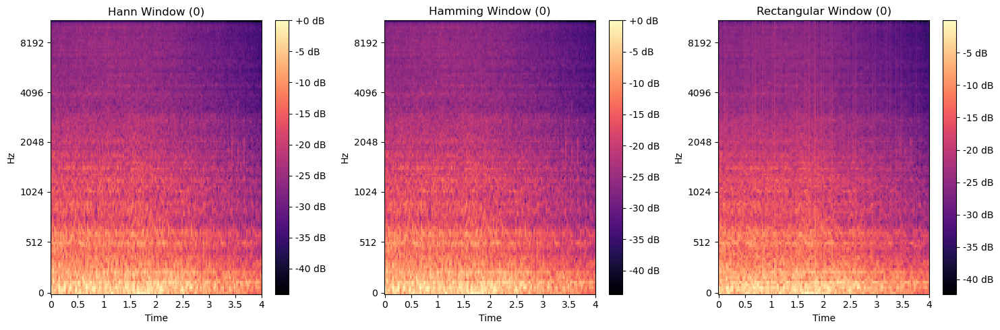

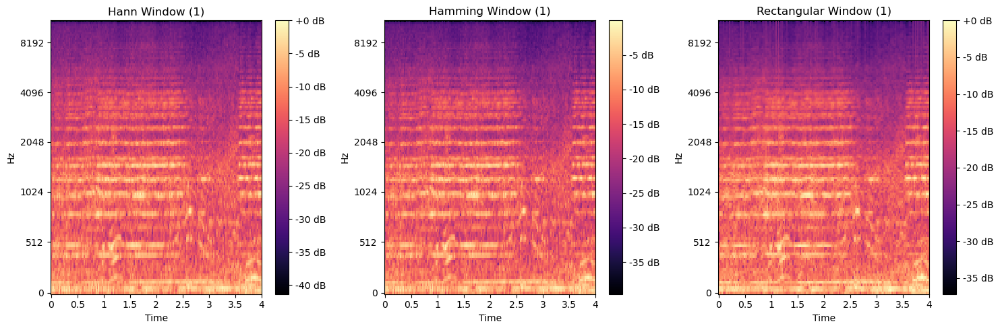

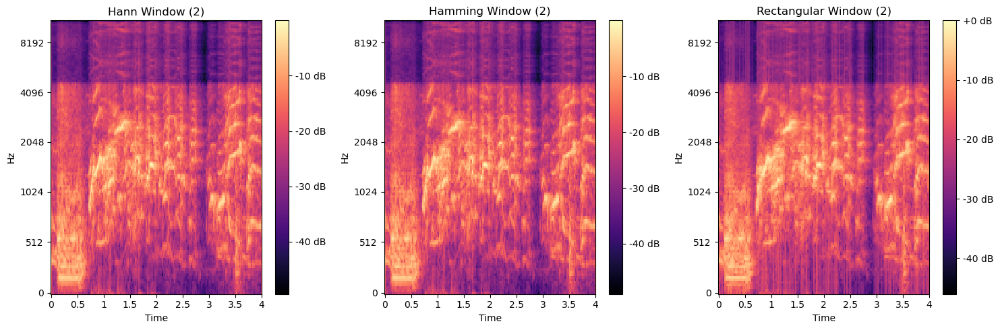

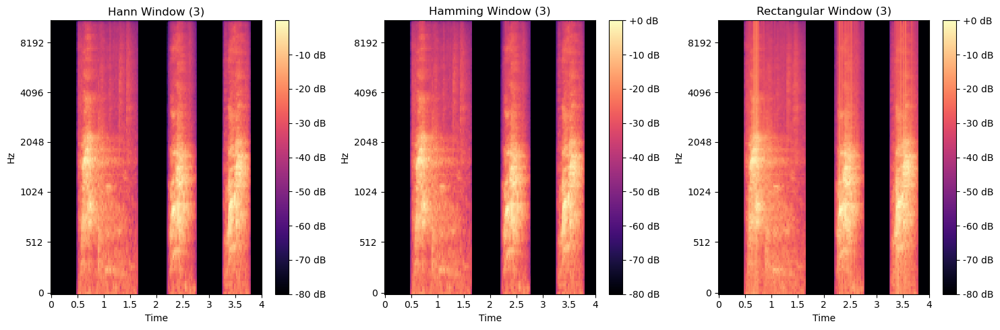

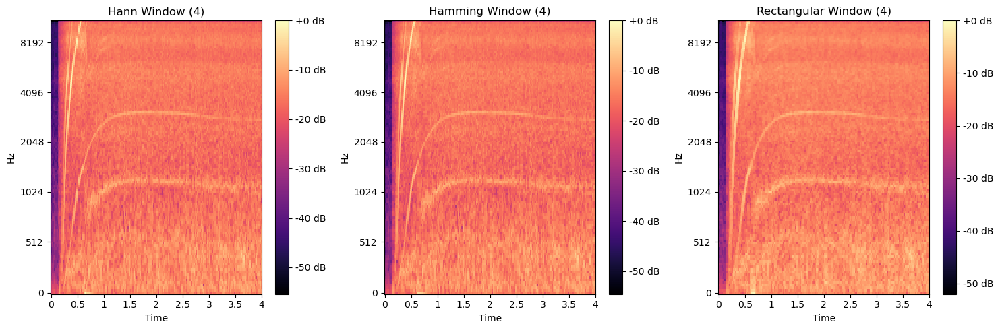

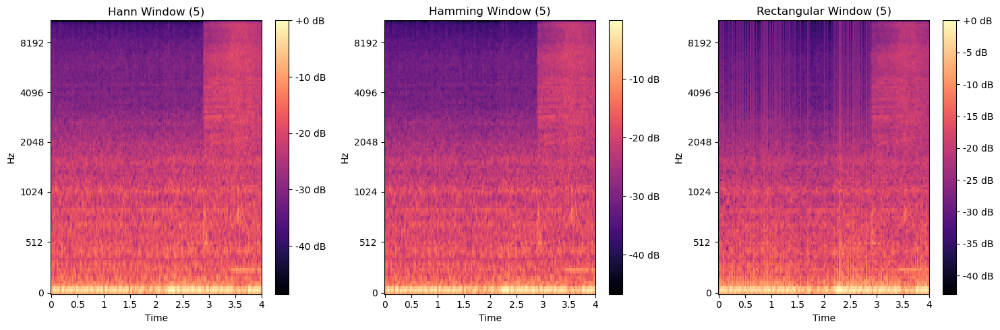

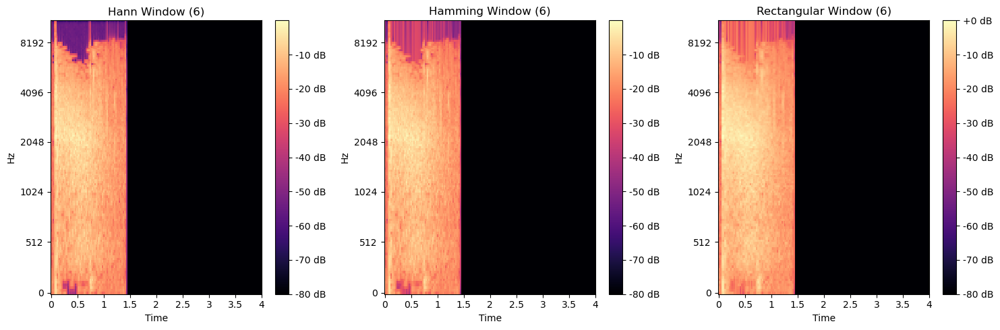

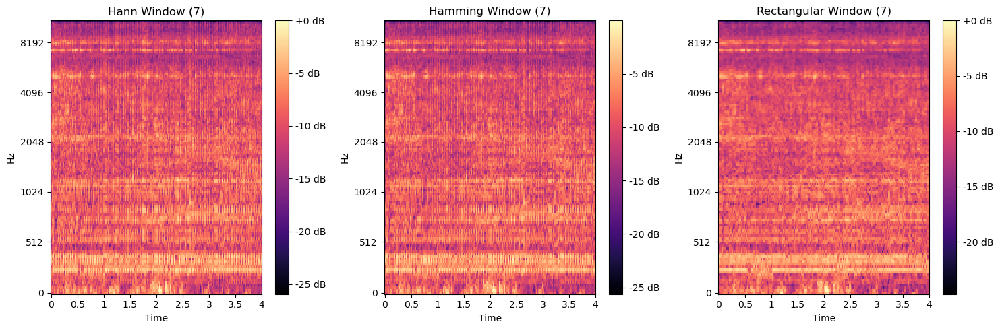

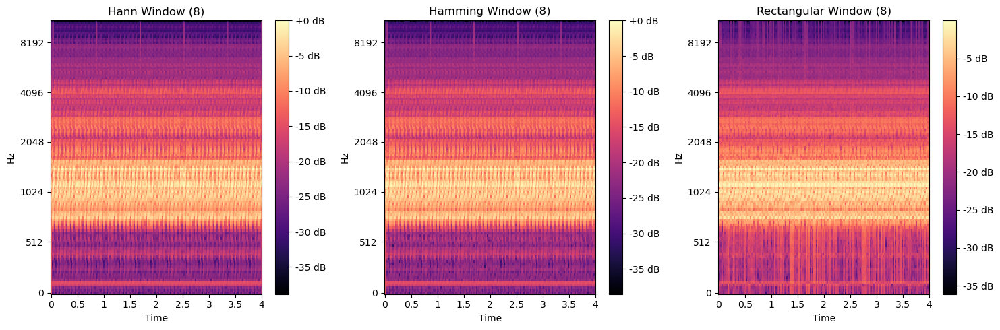

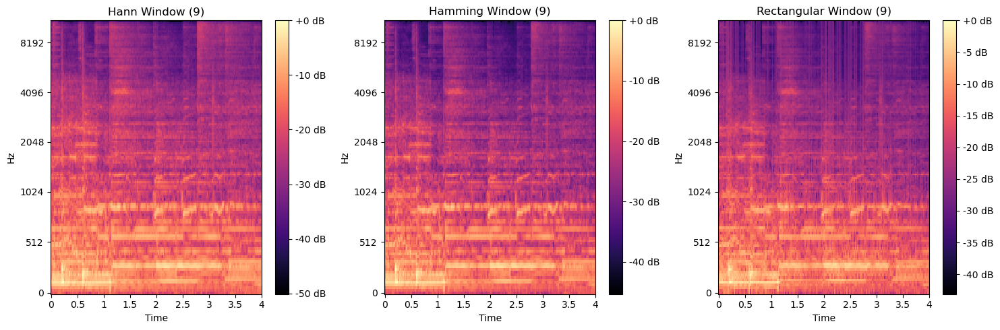


Processing window: Hann
Fold 1
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
CNN Accuracy: 50.86%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Fold 2
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
CNN Accuracy: 40.09%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packag

Fold 3
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
CNN Accuracy: 36.43%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packag

Fold 4
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
CNN Accuracy: 42.32%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Fold 5
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
CNN Accuracy: 37.18%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packag

Fold 6
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
CNN Accuracy: 46.29%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packag

Fold 7
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
Epoch 1/5, Loss: 2.1666
Epoch 2/5, Loss: 1.9159
Epoch 3/5, Loss: 1.7638
Epoch 4/5, Loss: 1.6776
Epoch 5/5, Loss: 1.6039
CNN Accuracy: 38.42%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packag

Fold 8
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
Epoch 1/5, Loss: 2.1584
Epoch 2/5, Loss: 1.9066
Epoch 3/5, Loss: 1.7377
Epoch 4/5, Loss: 1.6067
Epoch 5/5, Loss: 1.5173
CNN Accuracy: 43.55%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packag

Fold 9
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
Epoch 1/5, Loss: 2.1590
Epoch 2/5, Loss: 1.8638
Epoch 3/5, Loss: 1.6916
Epoch 4/5, Loss: 1.5307
Epoch 5/5, Loss: 1.4629
CNN Accuracy: 43.38%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Fold 10
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
Epoch 1/5, Loss: 2.1551
Epoch 2/5, Loss: 1.8733
Epoch 3/5, Loss: 1.6415
Epoch 4/5, Loss: 1.5418
Epoch 5/5, Loss: 1.4769
CNN Accuracy: 44.56%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Training SVM on full dataset...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=50000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN on full dataset...
Epoch 1/5, Loss: 2.2872
Epoch 2/5, Loss: 2.2481
Epoch 3/5, Loss: 2.1738
Epoch 4/5, Loss: 2.1228
Epoch 5/5, Loss: 2.0519


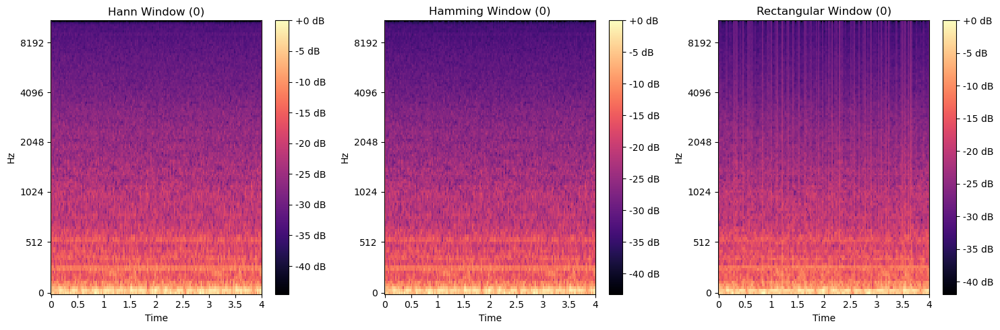

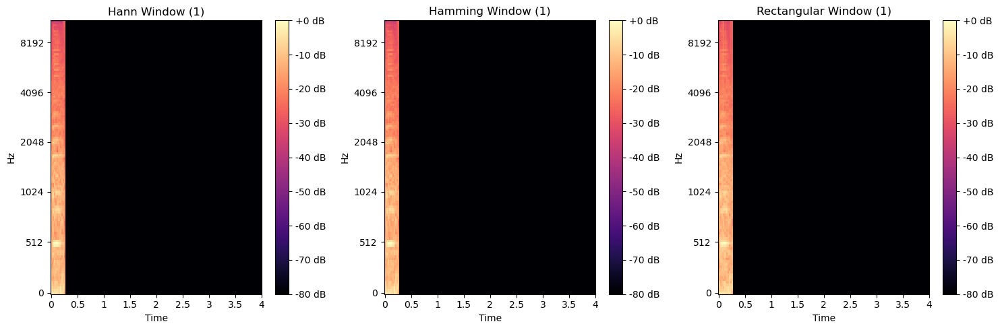

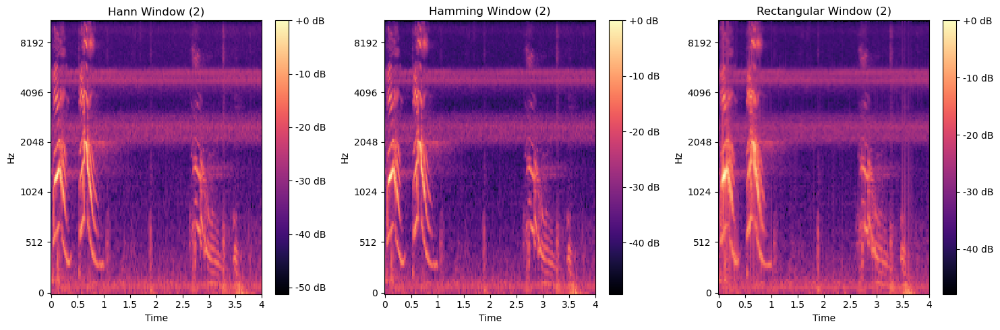

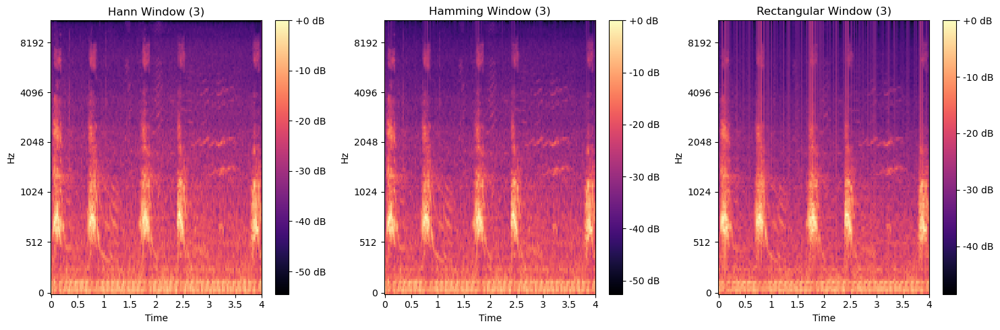

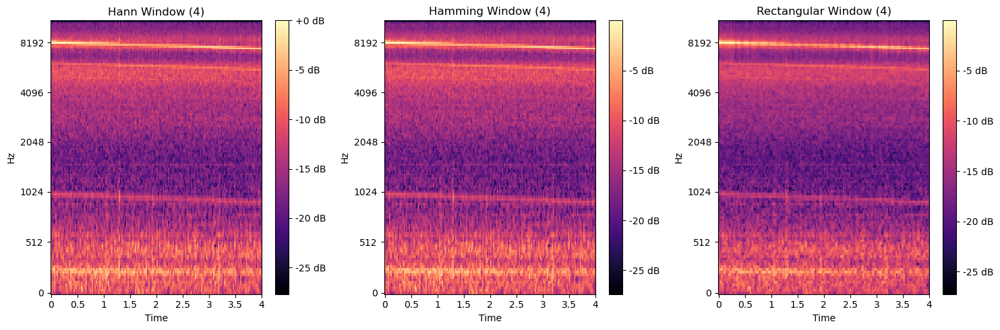

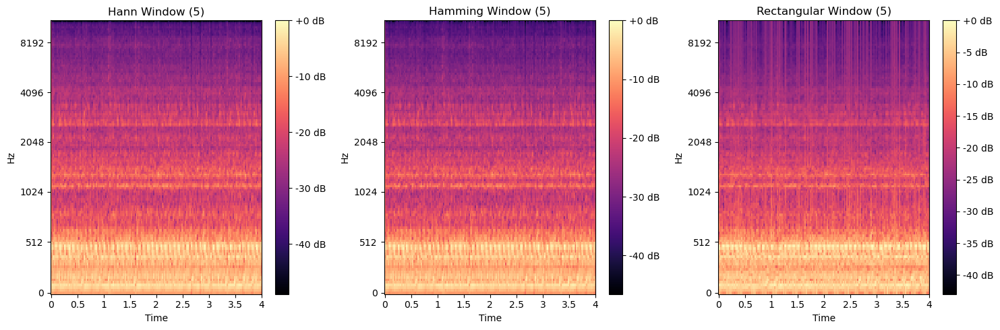

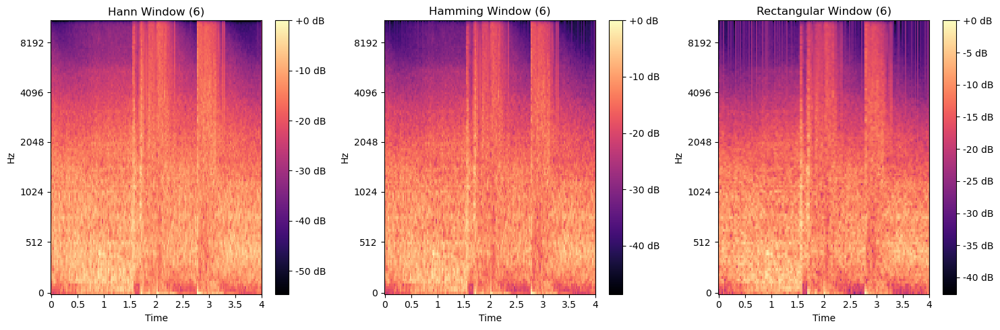

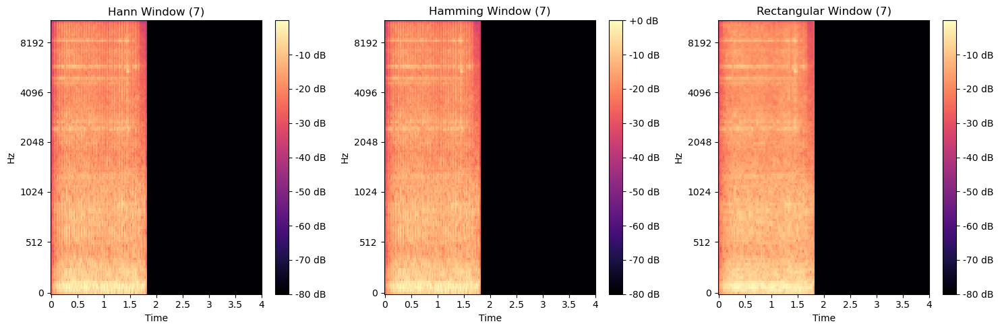

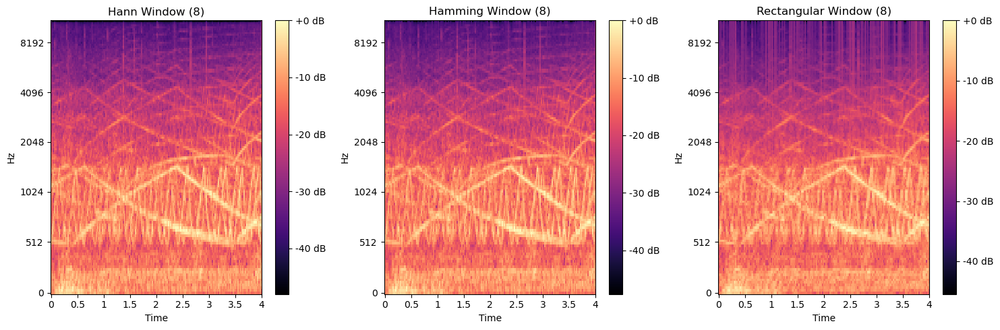

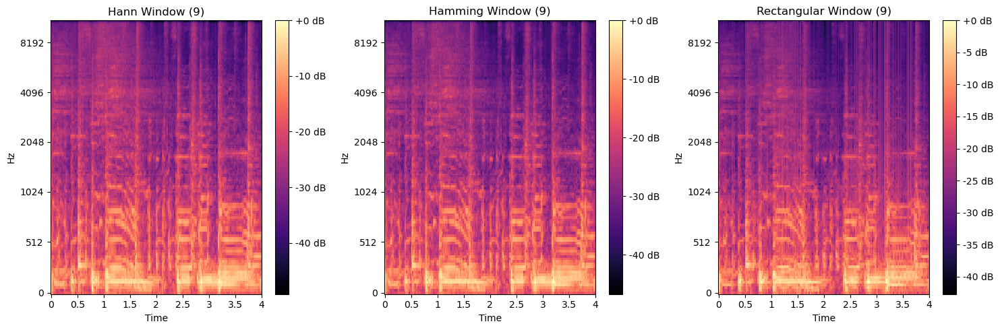


Processing window: Hamming
Fold 1
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
Epoch 1/5, Loss: 2.1600
Epoch 2/5, Loss: 1.9040
Epoch 3/5, Loss: 1.7498
Epoch 4/5, Loss: 1.6643
Epoch 5/5, Loss: 1.5824
CNN Accuracy: 41.35%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packag

Fold 2
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
Epoch 1/5, Loss: 2.1868
Epoch 2/5, Loss: 1.8560
Epoch 3/5, Loss: 1.6250
Epoch 4/5, Loss: 1.5007
Epoch 5/5, Loss: 1.4171
CNN Accuracy: 38.74%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Fold 3
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
Epoch 1/5, Loss: 2.1667
Epoch 2/5, Loss: 1.8516
Epoch 3/5, Loss: 1.6532
Epoch 4/5, Loss: 1.5713
Epoch 5/5, Loss: 1.5037
CNN Accuracy: 35.78%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packag

Fold 4
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
Epoch 1/5, Loss: 2.1605
Epoch 2/5, Loss: 1.8744
Epoch 3/5, Loss: 1.7146
Epoch 4/5, Loss: 1.6319
Epoch 5/5, Loss: 1.5730
CNN Accuracy: 27.98%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packag

Fold 5
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
Epoch 1/5, Loss: 2.1982
Epoch 2/5, Loss: 1.9177
Epoch 3/5, Loss: 1.6564
Epoch 4/5, Loss: 1.5400
Epoch 5/5, Loss: 1.4654
CNN Accuracy: 45.19%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Fold 6
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
Epoch 1/5, Loss: 2.1803
Epoch 2/5, Loss: 1.8951
Epoch 3/5, Loss: 1.6793
Epoch 4/5, Loss: 1.5652
Epoch 5/5, Loss: 1.4788
CNN Accuracy: 49.21%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packag

Fold 7
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
Epoch 1/5, Loss: 2.1610
Epoch 2/5, Loss: 1.8531
Epoch 3/5, Loss: 1.6481
Epoch 4/5, Loss: 1.5380
Epoch 5/5, Loss: 1.4537
CNN Accuracy: 45.11%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Fold 8
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
Epoch 1/5, Loss: 2.1870
Epoch 2/5, Loss: 1.8784
Epoch 3/5, Loss: 1.6660
Epoch 4/5, Loss: 1.5725
Epoch 5/5, Loss: 1.4912
CNN Accuracy: 45.91%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Fold 9
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
Epoch 1/5, Loss: 2.1811
Epoch 2/5, Loss: 1.9380
Epoch 3/5, Loss: 1.7287
Epoch 4/5, Loss: 1.5578
Epoch 5/5, Loss: 1.4656
CNN Accuracy: 41.79%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Fold 10
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
Epoch 1/5, Loss: 2.1587
Epoch 2/5, Loss: 1.8488
Epoch 3/5, Loss: 1.6752
Epoch 4/5, Loss: 1.5424
Epoch 5/5, Loss: 1.4643
CNN Accuracy: 48.98%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Training SVM on full dataset...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=50000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN on full dataset...
Epoch 1/5, Loss: 2.2951
Epoch 2/5, Loss: 2.2718
Epoch 3/5, Loss: 2.2247
Epoch 4/5, Loss: 2.1281
Epoch 5/5, Loss: 2.0280


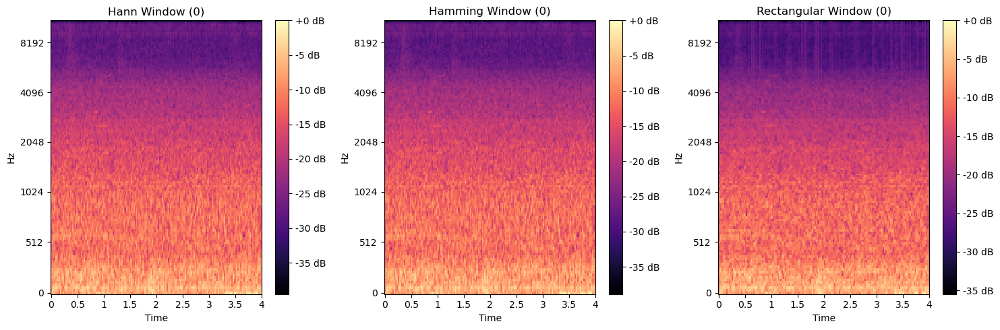

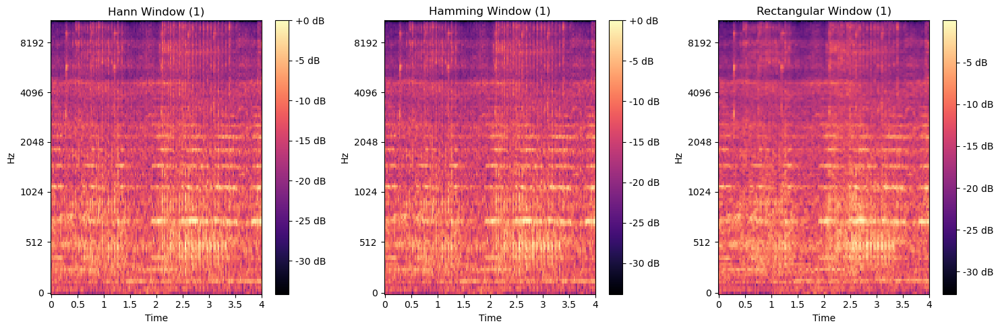

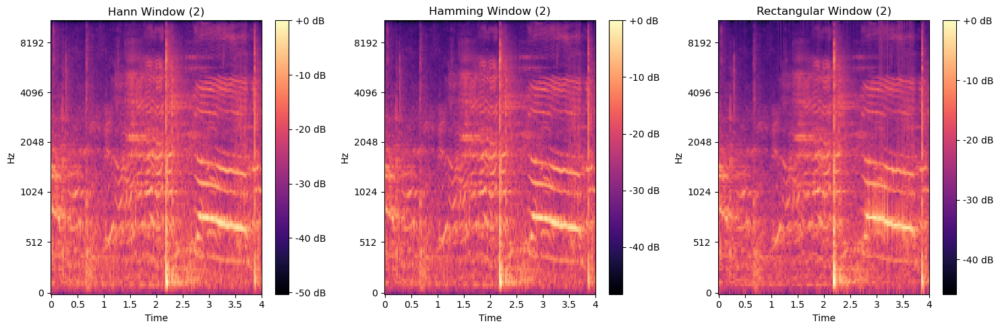

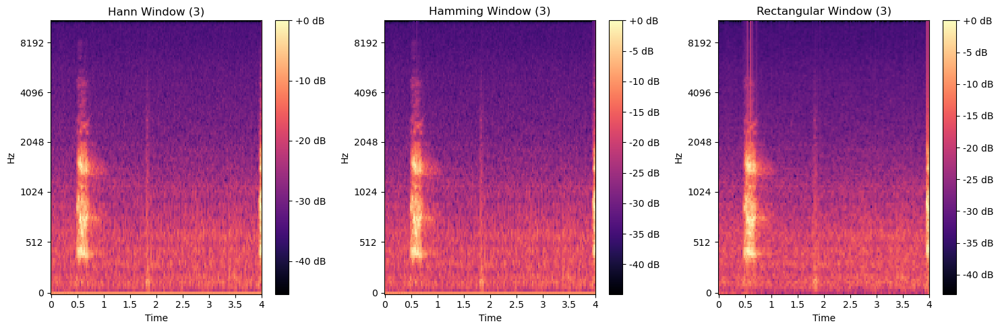

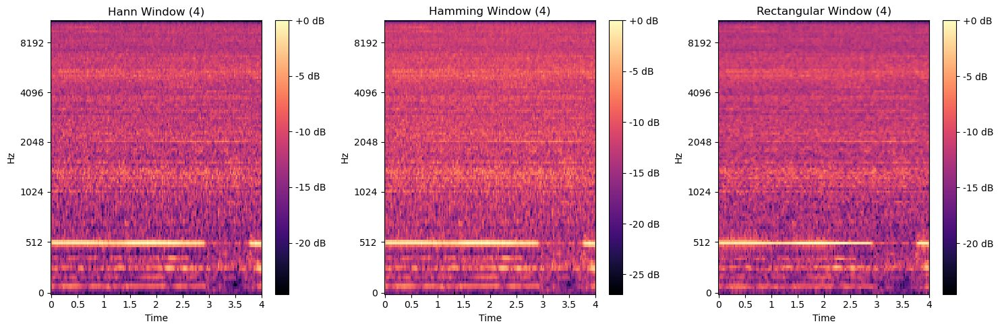

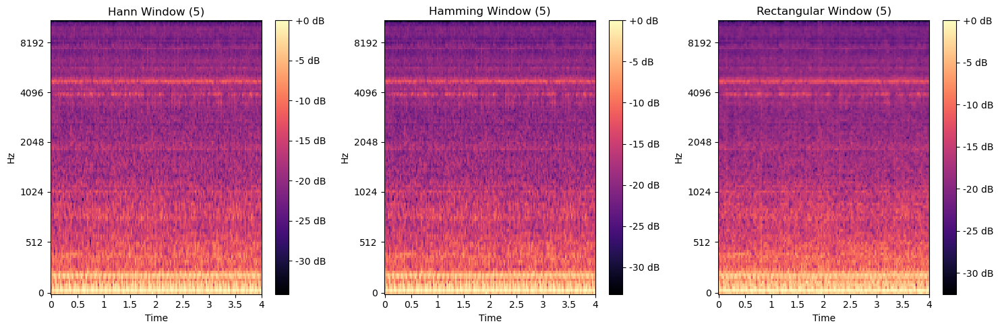

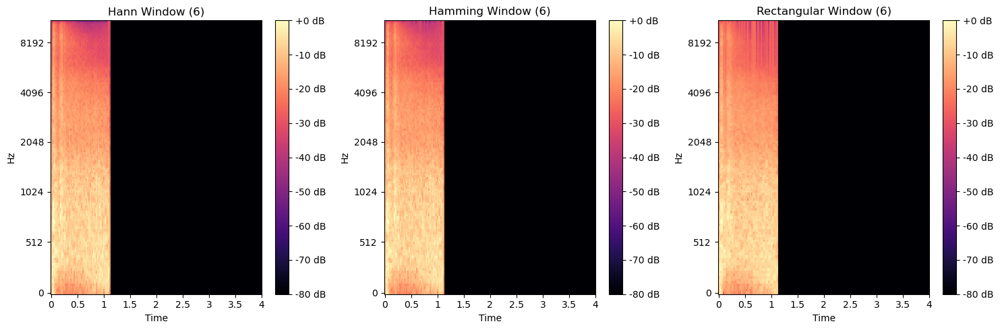

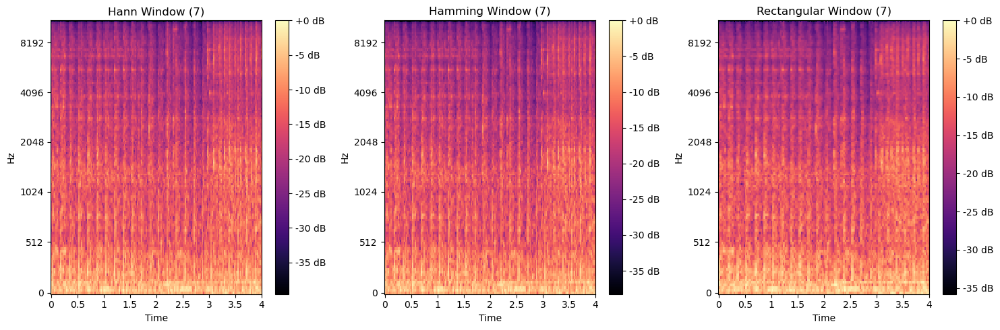

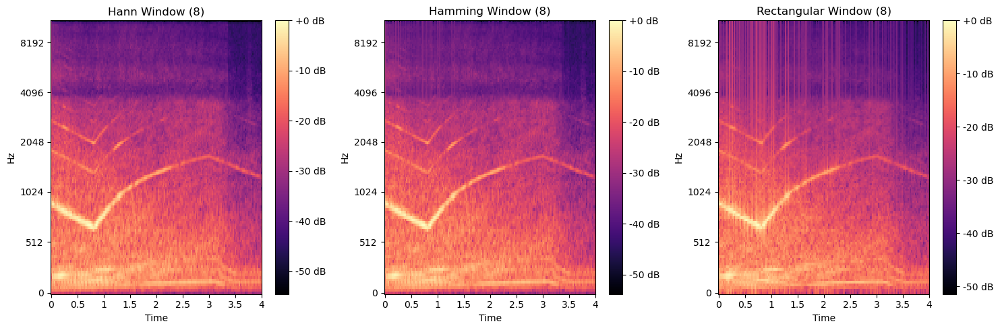

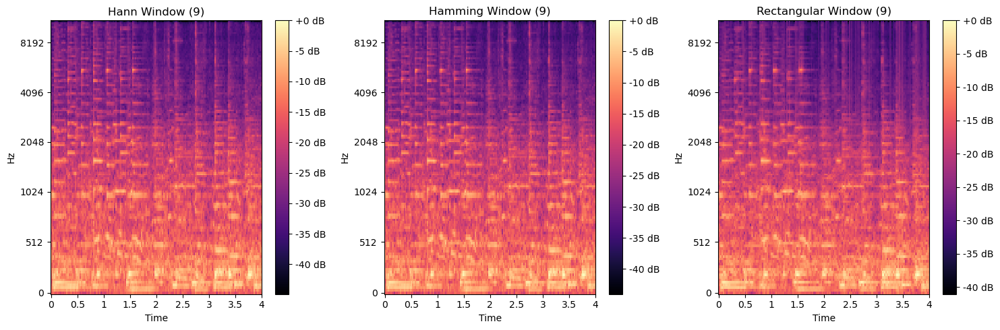


Processing window: Rectangular
Fold 1
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
Epoch 1/5, Loss: 2.2038
Epoch 2/5, Loss: 1.9618
Epoch 3/5, Loss: 1.8122
Epoch 4/5, Loss: 1.6957
Epoch 5/5, Loss: 1.6013
CNN Accuracy: 52.12%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Fold 2
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
Epoch 1/5, Loss: 2.1996
Epoch 2/5, Loss: 1.9084
Epoch 3/5, Loss: 1.7056
Epoch 4/5, Loss: 1.6059
Epoch 5/5, Loss: 1.5369
CNN Accuracy: 40.99%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Fold 3
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
Epoch 1/5, Loss: 2.2263
Epoch 2/5, Loss: 2.0194
Epoch 3/5, Loss: 1.8937
Epoch 4/5, Loss: 1.7532
Epoch 5/5, Loss: 1.6028
CNN Accuracy: 40.76%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packag

Fold 4
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
Epoch 1/5, Loss: 2.1673
Epoch 2/5, Loss: 1.9315
Epoch 3/5, Loss: 1.8049
Epoch 4/5, Loss: 1.6643
Epoch 5/5, Loss: 1.5683
CNN Accuracy: 42.73%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packag

Fold 5
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
Epoch 1/5, Loss: 2.1838
Epoch 2/5, Loss: 1.9141
Epoch 3/5, Loss: 1.7694
Epoch 4/5, Loss: 1.6201
Epoch 5/5, Loss: 1.5304
CNN Accuracy: 35.90%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Fold 6
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
Epoch 1/5, Loss: 2.2061
Epoch 2/5, Loss: 1.8775
Epoch 3/5, Loss: 1.6513
Epoch 4/5, Loss: 1.5546
Epoch 5/5, Loss: 1.4554
CNN Accuracy: 42.89%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Fold 7
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
Epoch 1/5, Loss: 2.1802
Epoch 2/5, Loss: 1.9698
Epoch 3/5, Loss: 1.9029
Epoch 4/5, Loss: 1.8484
Epoch 5/5, Loss: 1.8018
CNN Accuracy: 33.17%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packag

Fold 8
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
Epoch 1/5, Loss: 2.1976
Epoch 2/5, Loss: 1.9531
Epoch 3/5, Loss: 1.8115
Epoch 4/5, Loss: 1.6693
Epoch 5/5, Loss: 1.5842
CNN Accuracy: 44.42%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Fold 9
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
Epoch 1/5, Loss: 2.1953
Epoch 2/5, Loss: 1.9225
Epoch 3/5, Loss: 1.7218
Epoch 4/5, Loss: 1.5779
Epoch 5/5, Loss: 1.5159
CNN Accuracy: 43.75%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Fold 10
Training SVM...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN...
Epoch 1/5, Loss: 2.2030
Epoch 2/5, Loss: 1.9663
Epoch 3/5, Loss: 1.8269
Epoch 4/5, Loss: 1.6669
Epoch 5/5, Loss: 1.5585
CNN Accuracy: 51.97%


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Training SVM on full dataset...


c:\Users\aryan\anaconda3\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=50000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training CNN on full dataset...
Epoch 1/5, Loss: 2.2941
Epoch 2/5, Loss: 2.2583
Epoch 3/5, Loss: 2.2099
Epoch 4/5, Loss: 2.1397
Epoch 5/5, Loss: 2.0956


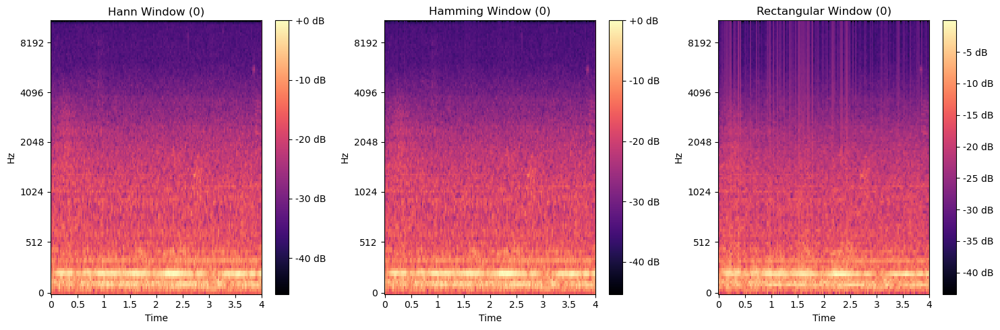

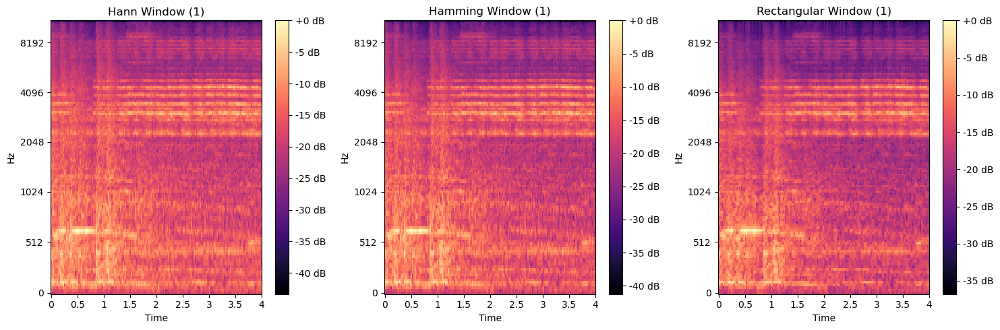

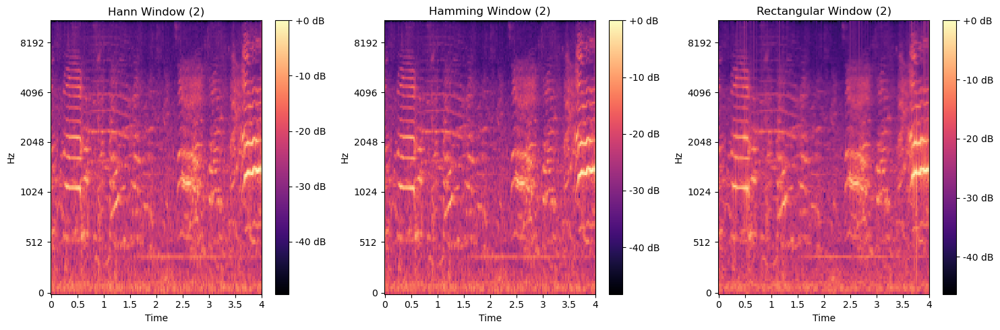

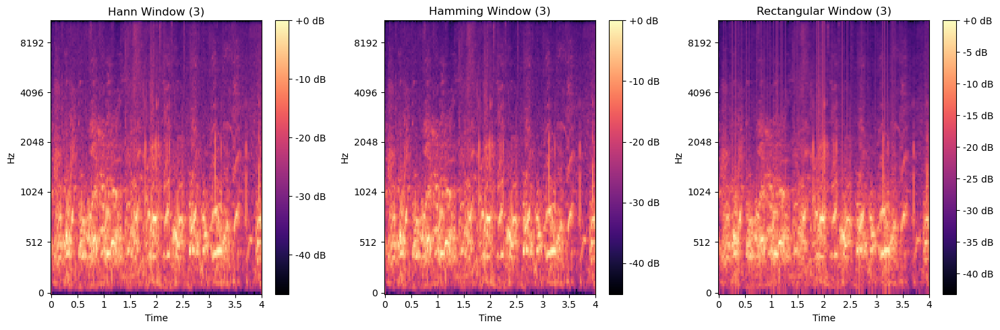

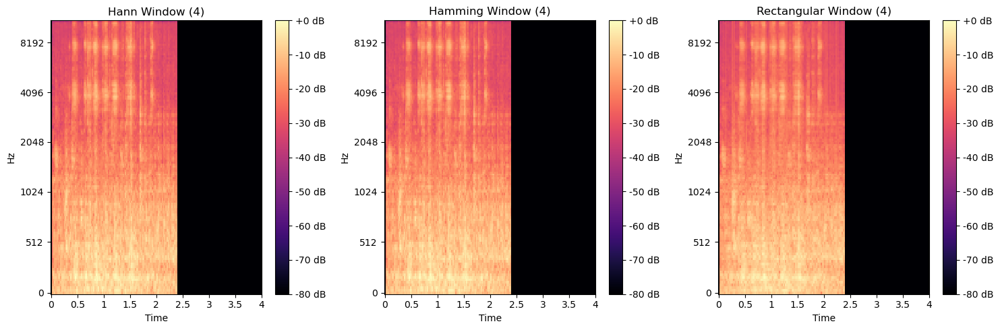

...

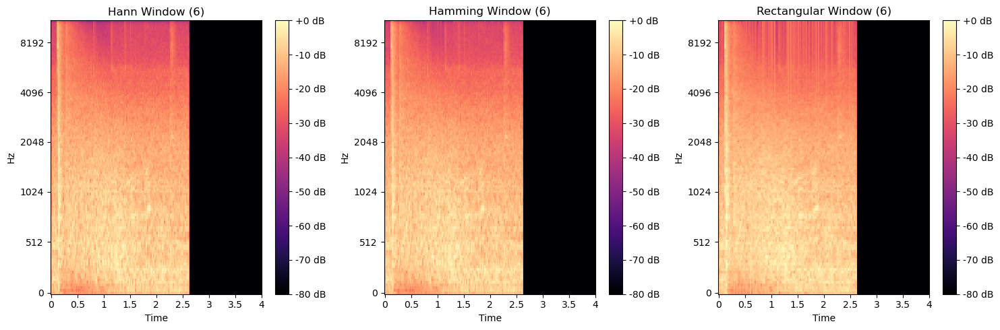

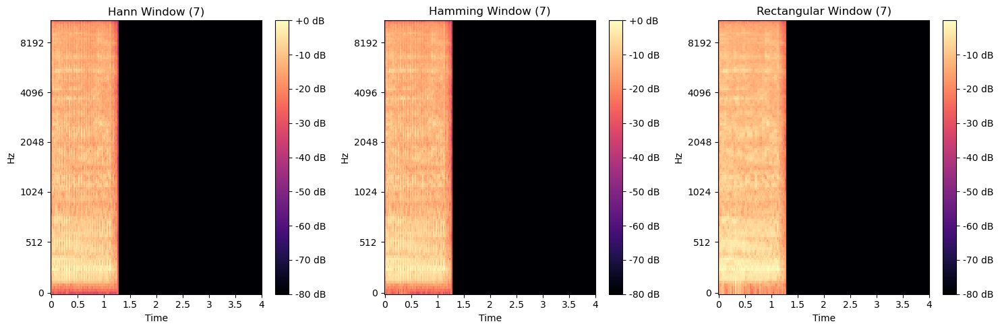

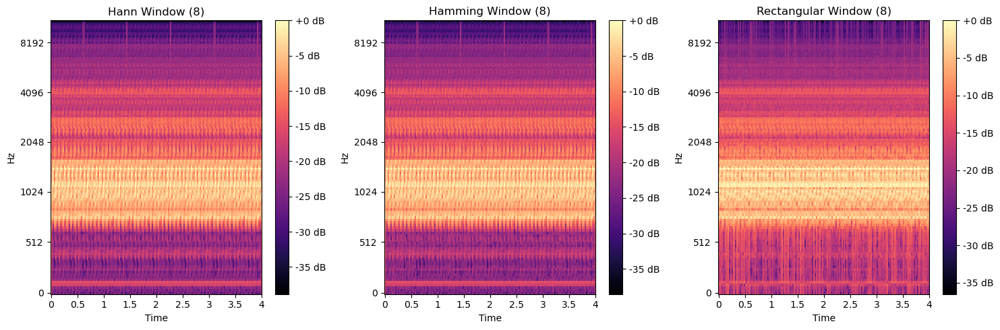

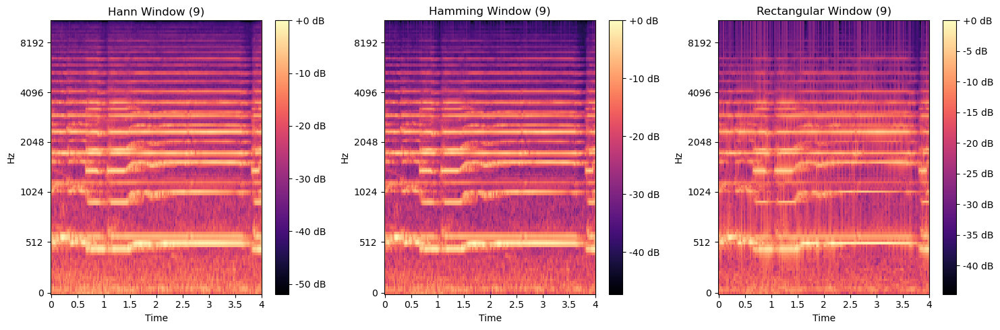

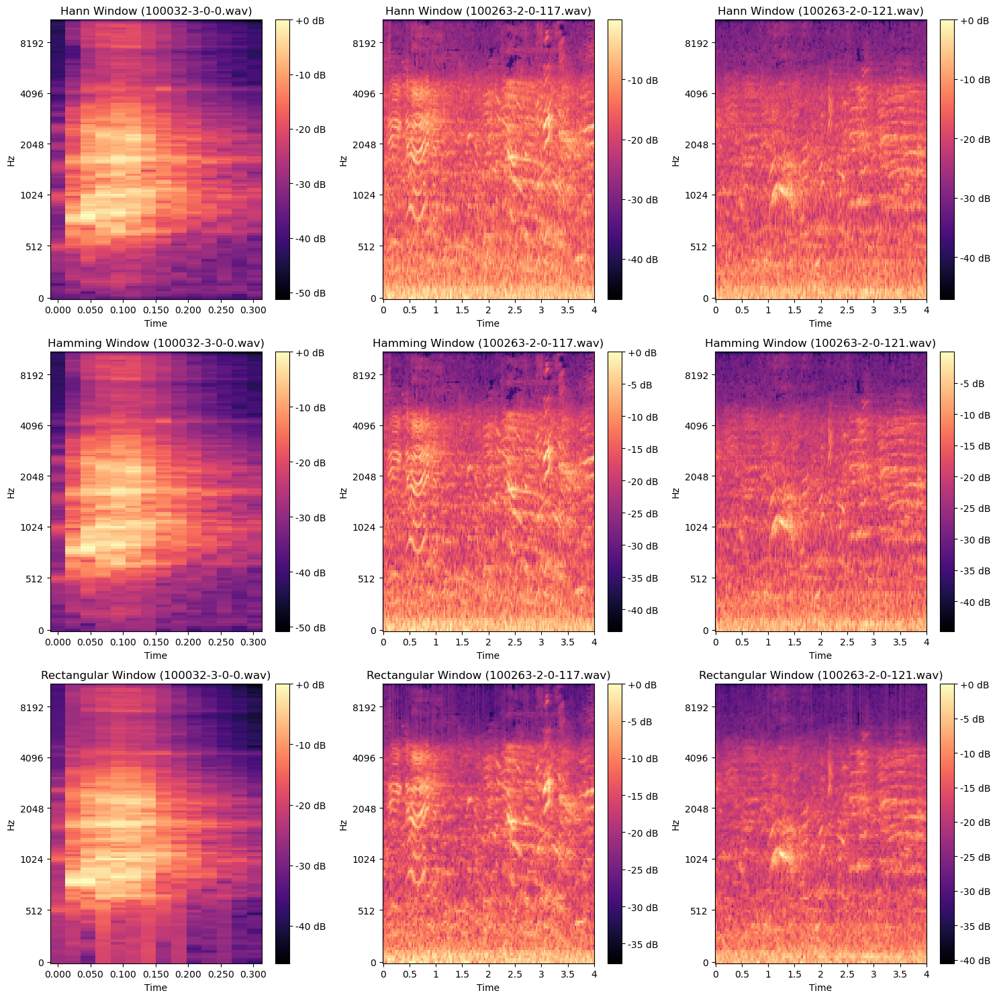

In [9]:
# Main Execution
Config.create_checkpoint_dir()

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("DEVICE:", device)

# Load Metadata
metadata = pd.read_csv(Config.METADATA_PATH)
label_encoder = LabelEncoder()
metadata['classID'] = label_encoder.fit_transform(metadata['classID'])
class_names = label_encoder.classes_.tolist()

window_functions = [
    ('Hann', WindowFunctions.hann_window),
    ('Hamming', WindowFunctions.hamming_window),
    ('Rectangular', WindowFunctions.rectangular_window)
]

results_file = Config.RESULTS_PATH

# Load existing results if available
try:
    with open(results_file, 'r') as f:
        results = json.load(f)
except FileNotFoundError:
    results = []

# Track processed folds for each window
processed_folds = {}
for res in results:
    window_name = res['window']  # Fix: Use res['window'] instead of res[0]['window']
    if window_name not in processed_folds:
        processed_folds[window_name] = []
    for fold_result in res.get('folds', []):
        processed_folds[window_name].append(fold_result['fold'])

for window_name, window_fn in window_functions:
    if window_name in processed_folds:
        completed_folds = processed_folds[window_name]
    else:
        completed_folds = []

    print(f'\nProcessing window: {window_name}')
    
    current_results = []
    window_results = {'window': window_name, 'folds': []}

    # 10-fold CV
    svm_accuracies = []
    cnn_accuracies = []
    svm_reports = []
    cnn_reports = []

    for fold in range(1, 11):
        if fold in completed_folds:
            print(f"Skipping already processed fold: {fold}")
            continue
        
        print(f'Fold {fold}')
        
        # Load data for current fold
        train_mask = metadata['fold'] != fold
        test_mask = metadata['fold'] == fold
        
        train_audio = [
            os.path.join(Config.AUDIO_DIR, f"fold{fold}", filename)
            for fold, filename in zip(
                metadata[train_mask]['fold'], 
                metadata[train_mask]['slice_file_name']
            )
        ]
        test_audio = [
            os.path.join(Config.AUDIO_DIR, f"fold{fold}", filename)
            for fold, filename in zip(
                metadata[test_mask]['fold'], 
                metadata[test_mask]['slice_file_name']
            )
        ]
        train_labels = metadata[train_mask]['classID'].values
        test_labels = metadata[test_mask]['classID'].values

        # SVM Pipeline
        print('Training SVM...')
        X_train_svm = np.array([extract_features_svm(path, window_fn) for path in train_audio])
        X_test_svm = np.array([extract_features_svm(path, window_fn) for path in test_audio])
        svm_acc, svm_model = train_svm(X_train_svm, train_labels, X_test_svm, test_labels)
        svm_accuracies.append(svm_acc)

        # Get SVM predictions and classification report
        y_pred_svm = svm_model.predict(X_test_svm)
        svm_report = classification_report(
            test_labels, y_pred_svm, 
            output_dict=True, 
            target_names=class_names,
            zero_division=0
        )
        svm_reports.append(svm_report)
        for class_name in class_names:
            precision = svm_report[class_name]['precision']
            recall = svm_report[class_name]['recall']
            if precision == 0.0:
                print(f"Warning: SVM did not predict class '{class_name}' in this fold.")

        # CNN Pipeline
        print('Training CNN...')
        train_dataset = UrbanSoundDatasetCNN(train_audio, train_labels, window_fn)
        test_dataset = UrbanSoundDatasetCNN(test_audio, test_labels, window_fn)
        
        train_loader = DataLoader(train_dataset, batch_size=Config.BATCH_SIZE, shuffle=True)
        test_loader = DataLoader(test_dataset, batch_size=Config.BATCH_SIZE, shuffle=False)
        
        model = AudioCNN().to(device)
        criterion = nn.CrossEntropyLoss()
        optimizer = optim.Adam(model.parameters(), lr=Config.LEARNING_RATE)

        # Define checkpoint path
        checkpoint_path = os.path.join(Config.CHECKPOINT_DIR, f'cnn_checkpoint_{window_name}_fold{fold}.pth')
        
        epoch_losses = train_cnn(model, train_loader, criterion, optimizer, device, Config.NUM_EPOCHS, checkpoint_path)
        cnn_acc = evaluate_cnn(model, test_loader, device)
        cnn_accuracies.append(cnn_acc)
        print(f'CNN Accuracy: {cnn_acc:.2f}%')

        # Get CNN predictions and classification report
        all_preds = []
        all_labels = []
        with torch.no_grad():
            for inputs, labels in test_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())
        cnn_report = classification_report(
            all_labels, all_preds, 
            output_dict=True, 
            target_names=class_names,
            zero_division=0
        )
        cnn_reports.append(cnn_report)

        # Save results after each fold
        fold_result={
            "window": window_name,
            'fold': fold,
            'svm_accuracy': svm_acc,
            'cnn_accuracy': cnn_acc,
            'svm_report': classification_report(test_labels, y_pred_svm, output_dict=True),
            'cnn_report': classification_report(all_labels, all_preds, output_dict=True)
        }
        current_results.append(fold_result)
        window_results['folds'].append(fold_result)

        # Save intermediate results
        with open(results_file, 'w') as f:
            json.dump(results + [current_results], f)

    # After processing all folds
    window_results = {
        'window': window_name,
        'folds': current_results,
        'svm_10fold': {
            'accuracy': np.mean(svm_accuracies),
            'macro_precision': np.mean([report['macro avg']['precision'] for report in svm_reports])
        },
        'cnn_10fold': {
            'accuracy': np.mean(cnn_accuracies),
            'macro_precision': np.mean([report['macro avg']['precision'] for report in cnn_reports])
        }
    }   

    results.append(window_results)  # Append the complete window results

    # Single Train-Test Split
    test_fold = 10
    test_mask = metadata['fold'] == test_fold
    train_mask = metadata['fold'] != test_fold
    
    
    train_labels = metadata[train_mask]['classID'].values
    test_labels = metadata[test_mask]['classID'].values

    # Train SVM on full dataset
    print('Training SVM on full dataset...')
    X_train_svm = np.array([extract_features_svm(path, window_fn) for path in train_audio])
    X_test_svm = np.array([extract_features_svm(path, window_fn) for path in test_audio])
    svm_model = SVC(kernel='linear', C=1.0, max_iter=50000, class_weight='balanced')
    svm_model.fit(X_train_svm, train_labels)
    y_pred_svm = svm_model.predict(X_test_svm)
    svm_acc = accuracy_score(test_labels, y_pred_svm)

    # Train CNN on full dataset
    print('Training CNN on full dataset...')
    train_dataset = UrbanSoundDatasetCNN(train_audio, train_labels, window_fn)
    test_dataset = UrbanSoundDatasetCNN(test_audio, test_labels, window_fn)
    train_loader = DataLoader(train_dataset, batch_size=Config.BATCH_SIZE, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=Config.BATCH_SIZE, shuffle=False)
    model = AudioCNN().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=Config.LEARNING_RATE)
    
    checkpoint_path = os.path.join(Config.CHECKPOINT_DIR, f'cnn_full_checkpoint_{window_name}.pth')
    epoch_losses = train_cnn(model, train_loader, criterion, optimizer, device, Config.NUM_EPOCHS, checkpoint_path)
    cnn_acc = evaluate_cnn(model, test_loader, device)

    # Store single split results
    results.append({
        'window': window_name,
        'svm_single': {
            'accuracy': svm_acc,
            'macro_precision': classification_report(test_labels, y_pred_svm, output_dict=True)['macro avg']['precision']
        },
        'cnn_single': {
            'accuracy': cnn_acc,
            'macro_precision': classification_report(all_labels, all_preds, output_dict=True)['macro avg']['precision']
        }
    })

    # Save results after each window
    with open(results_file, 'w') as f:
        json.dump(results, f)
    
# Generate Spectrograms
spectrogram_dir = "./spectrograms"
os.makedirs(spectrogram_dir, exist_ok=True)

for class_id in range(len(class_names)):
    plot_class_spectrograms(class_names, class_id, window_functions, save_dir=spectrogram_dir)
    
sample_audio_paths = train_audio
plot_dataset_spectrograms(sample_audio_paths, window_functions, save_dir=spectrogram_dir)

In [2]:
import json
import matplotlib.pyplot as plt
import numpy as np

with open('results.json', 'r') as f:
    result = json.load(f)

In [4]:
metrics = {
    'Hann': {'SVM': [], 'CNN': []},
    'Hamming': {'SVM': [], 'CNN': []},
    'Rectangular': {'SVM': [], 'CNN': []}
}

for res in result:
    if 'folds' not in res:  # Skip entries without 'folds' key
        continue
    window = res['window']
    print(f"Processing window: {window}")
    for fold in res['folds']:
        svm_report = fold['svm_report']
        cnn_report = fold['cnn_report']
        
        # Extract metrics (macro avg for consistency)
        svm_macro = svm_report['macro avg']
        cnn_macro = cnn_report['macro avg']
        
        metrics[window]['SVM'].append({
            'accuracy': fold['svm_accuracy'],
            'precision': svm_macro['precision'],
            'recall': svm_macro['recall'],
            'f1': svm_macro['f1-score']
        })
        metrics[window]['CNN'].append({
            'accuracy': fold['cnn_accuracy'],
            'precision': cnn_macro['precision'],
            'recall': cnn_macro['recall'],
            'f1': cnn_macro['f1-score']
        })

Processing window: Hann
Processing window: Hamming
Processing window: Rectangular


Plotting Hann Window Metrics...


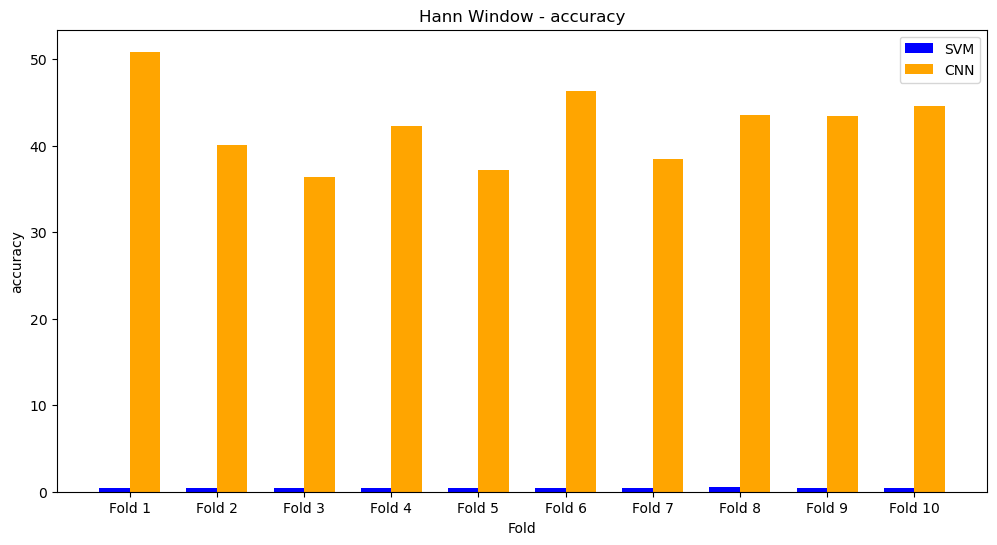

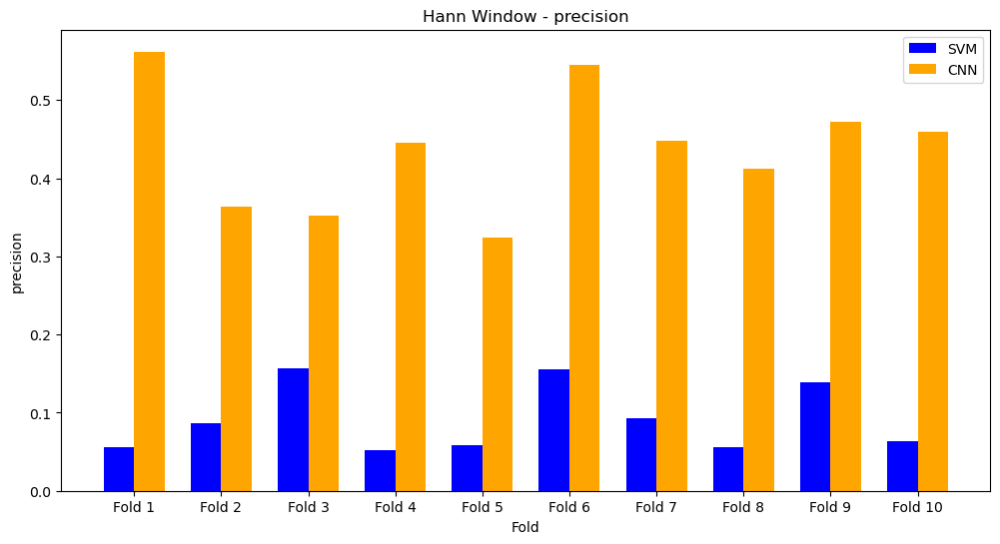

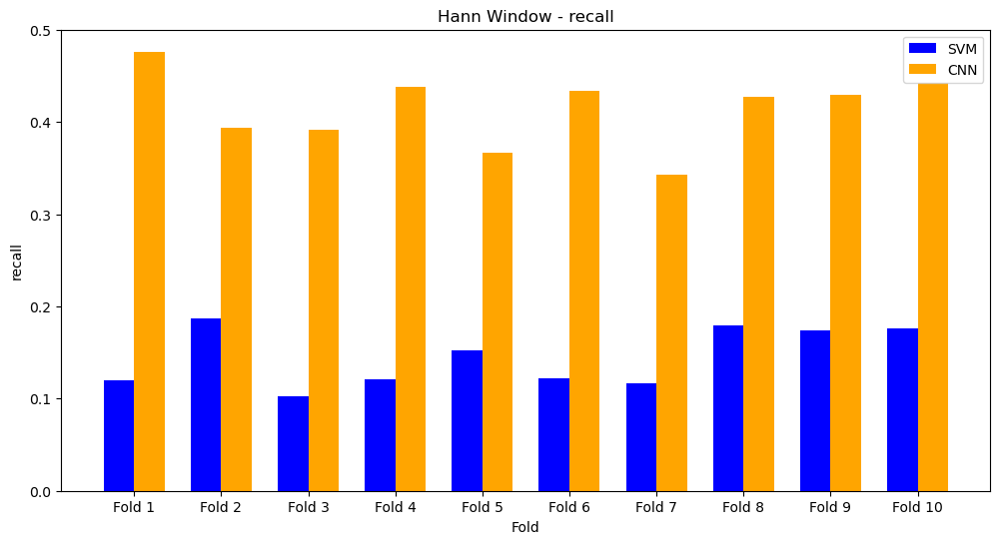

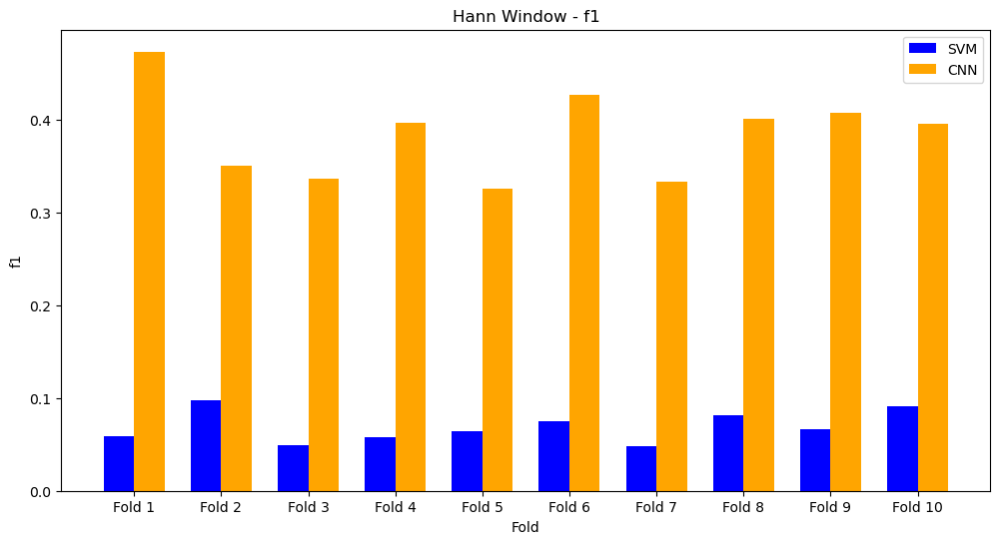

Plotting Hamming Window Metrics...


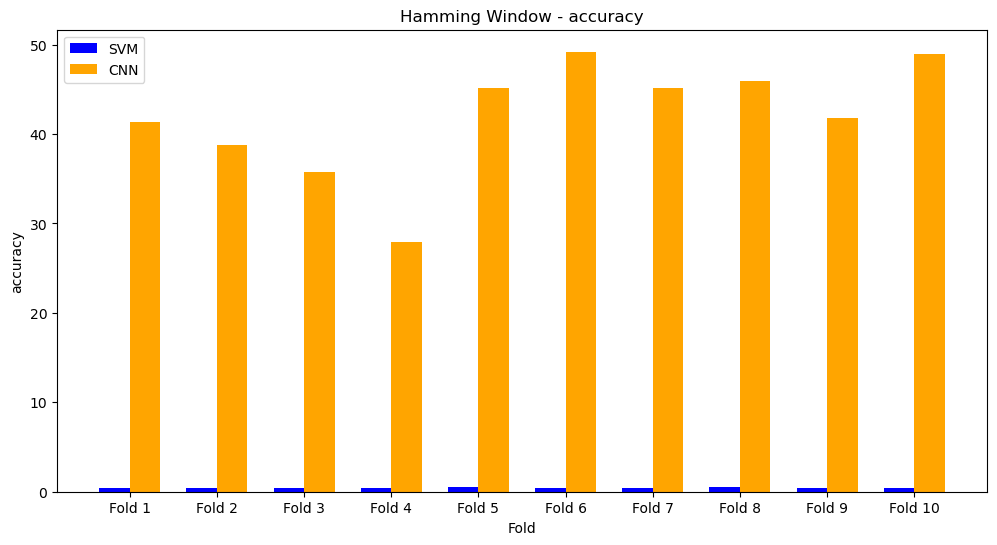

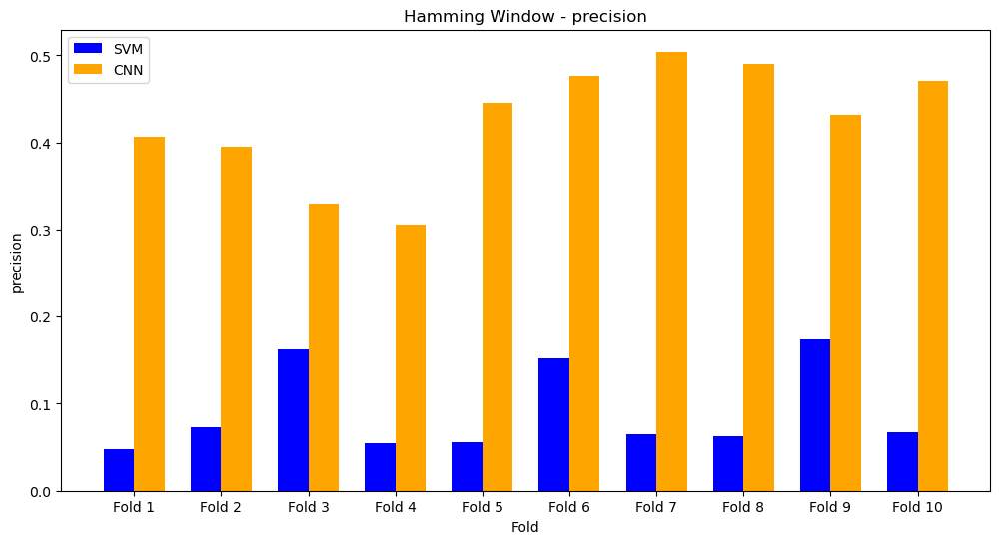

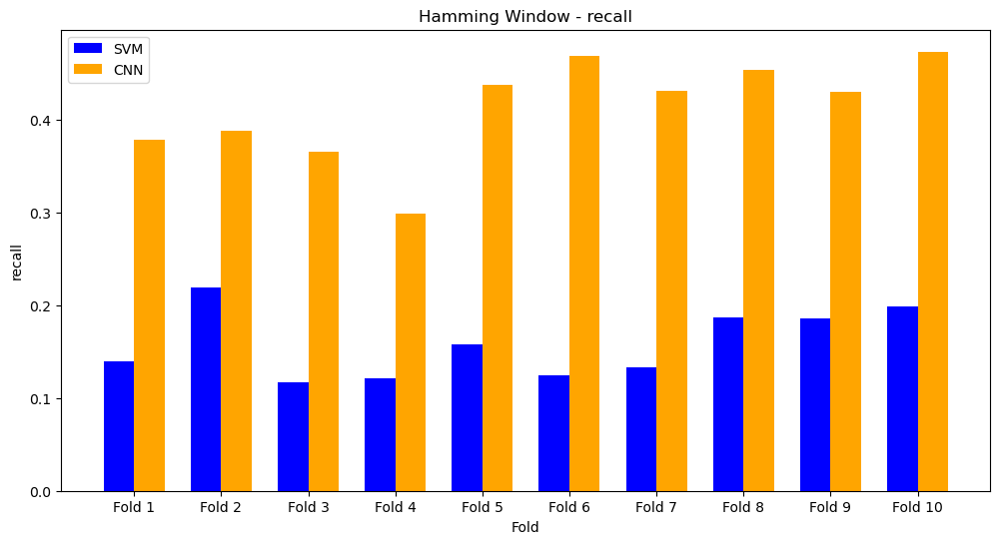

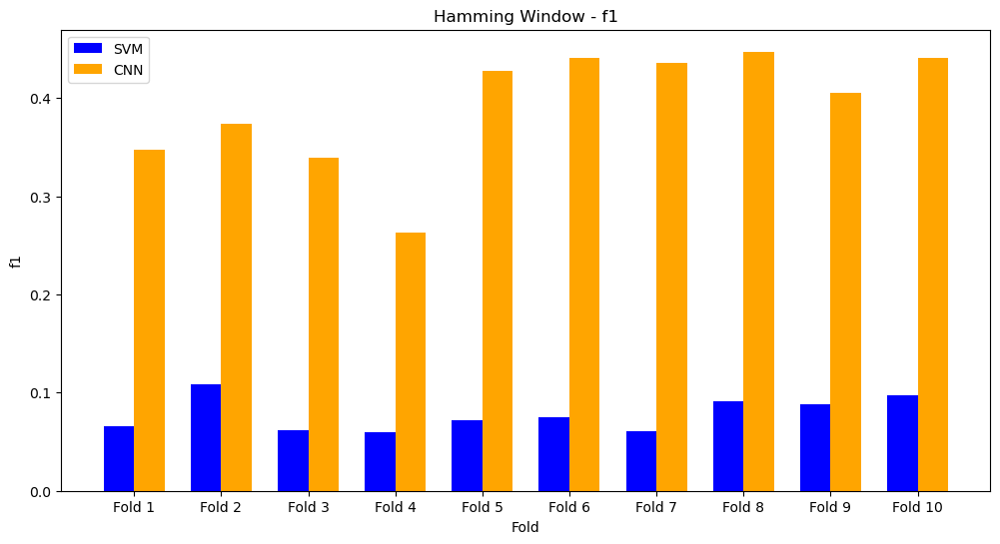

Plotting Rectangular Window Metrics...


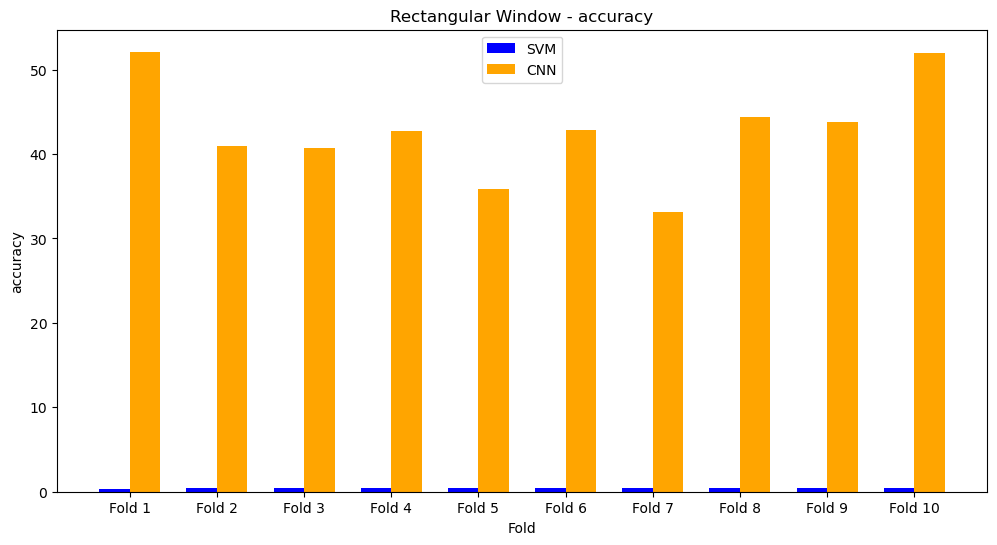

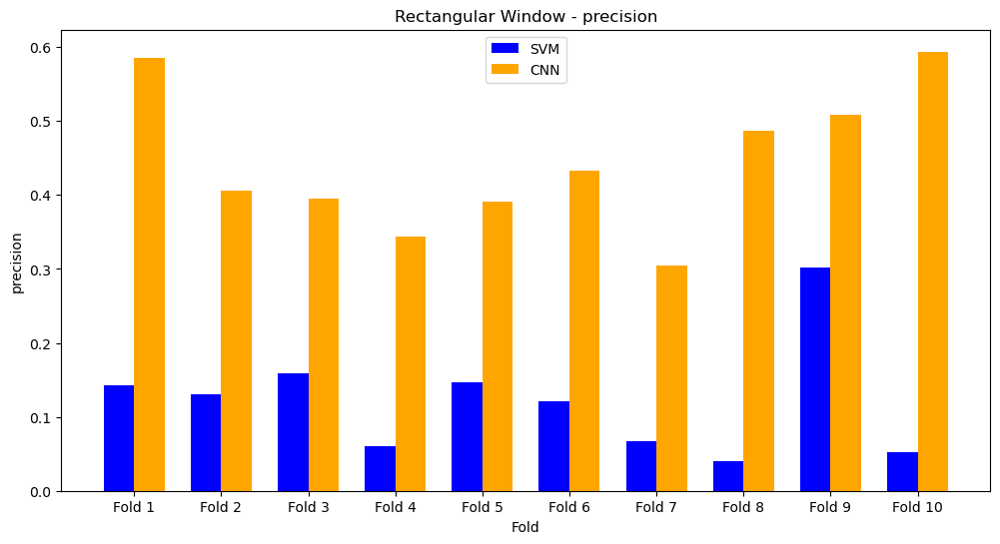

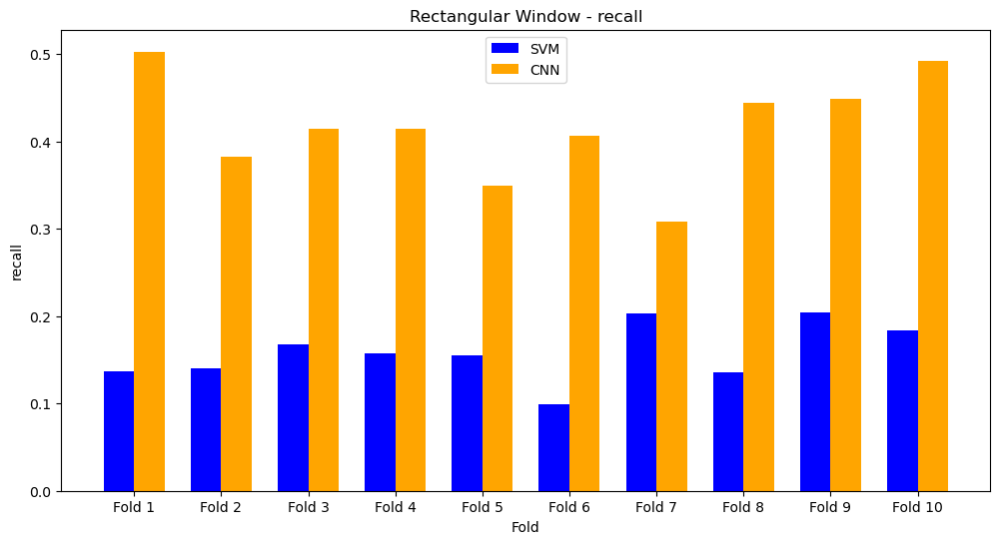

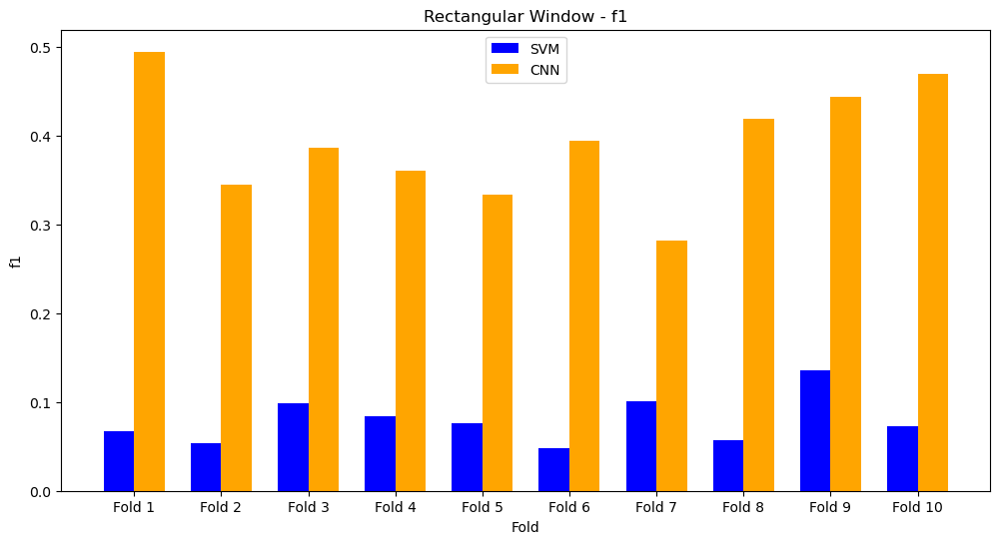

In [5]:
def plot_metrics(window, svm_data, cnn_data, metric_name):
    fig, ax = plt.subplots(figsize=(12, 6))
    x = np.arange(len(svm_data))  # Number of folds
    width = 0.35  # Width of the bars

    # Extract metric values for SVM and CNN
    svm_values = [fold[metric_name] for fold in svm_data]
    cnn_values = [fold[metric_name] for fold in cnn_data]

    # Plot SVM bars
    ax.bar(x - width/2, svm_values, width, label='SVM', color='blue')
    # Plot CNN bars
    ax.bar(x + width/2, cnn_values, width, label='CNN', color='orange')

    ax.set_title(f'{window} Window - {metric_name}')
    ax.set_xlabel('Fold')
    ax.set_ylabel(metric_name)
    ax.set_xticks(x)
    ax.set_xticklabels([f'Fold {i+1}' for i in x])
    ax.legend()
    plt.show()

# Plot per-fold metrics for each window
for window in metrics:
    print(f"Plotting {window} Window Metrics...")
    svm_data = metrics[window]['SVM']
    cnn_data = metrics[window]['CNN']
    for metric in ['accuracy', 'precision', 'recall', 'f1']:
        plot_metrics(window, svm_data, cnn_data, metric)

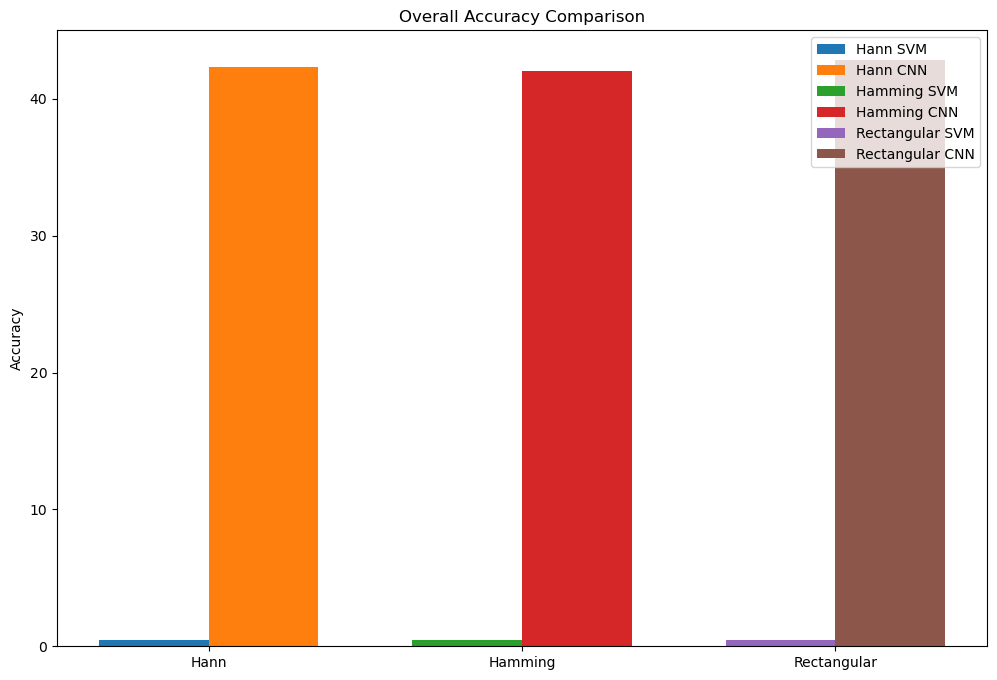

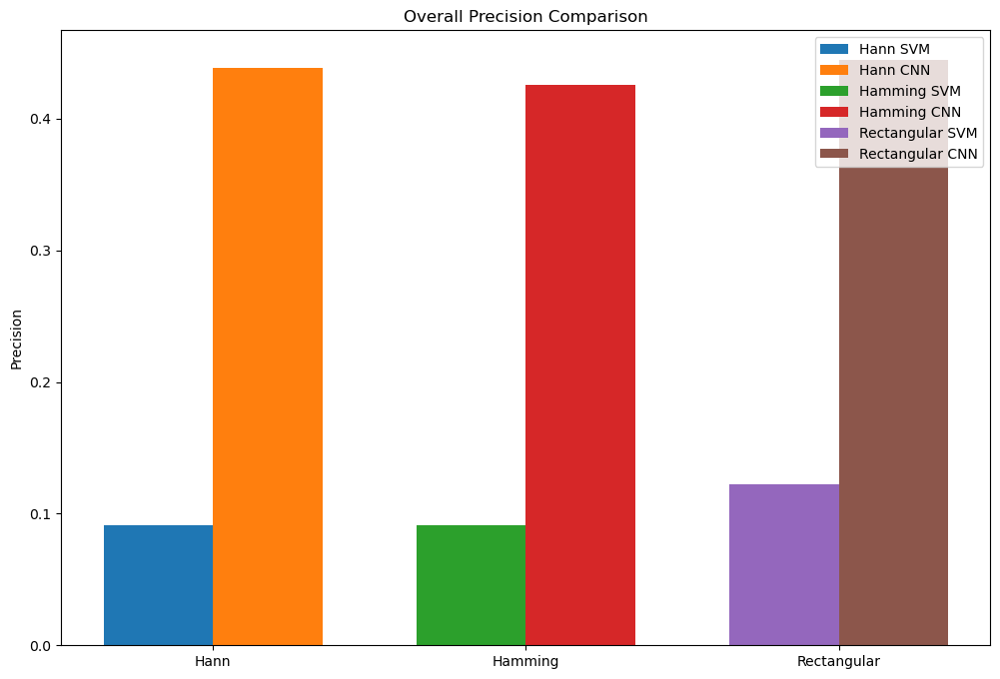

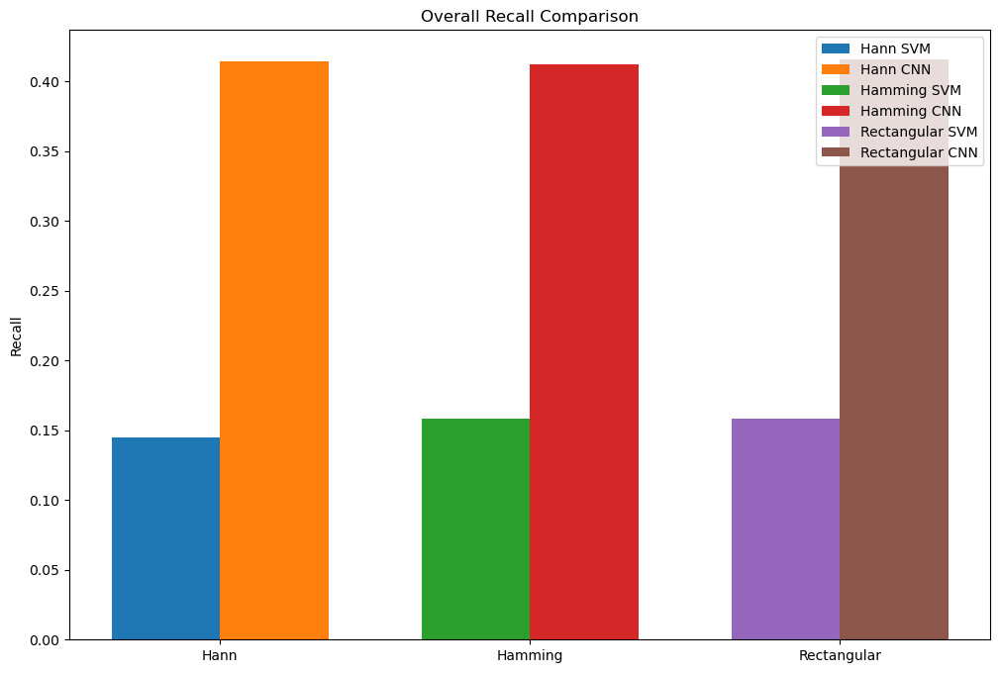

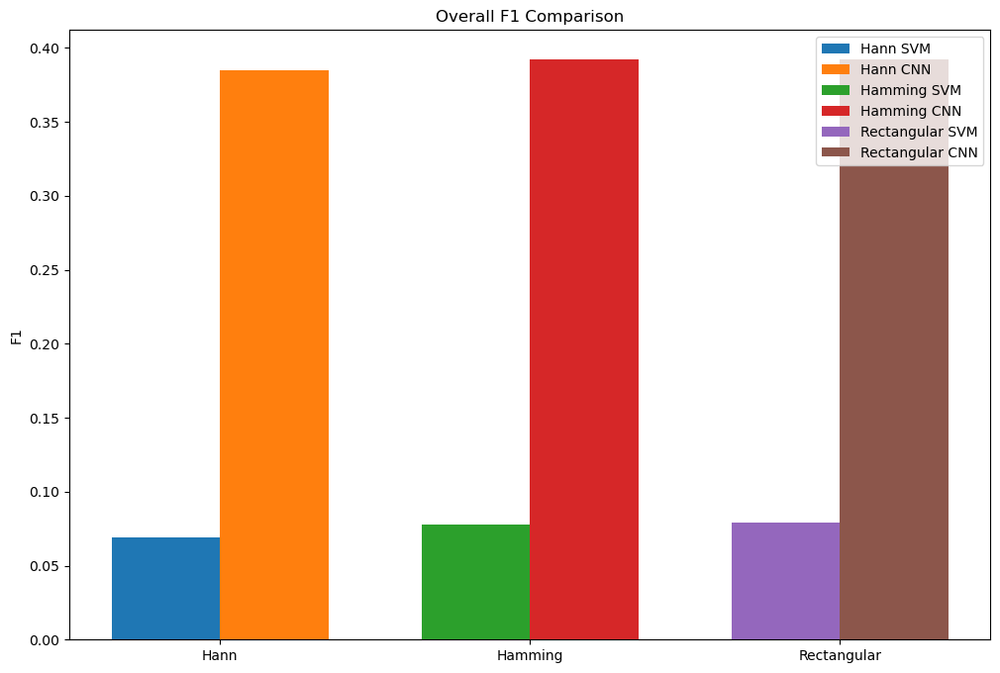

In [6]:
def plot_overall_metrics(metric:str):
    fig, ax = plt.subplots(figsize=(12, 8))
    x = np.arange(len(metrics))
    width = 0.35

    for i, (window, data) in enumerate(metrics.items()):
        svm_acc = np.mean([d[f'{metric}'] for d in data['SVM']])
        cnn_acc = np.mean([d[f'{metric}'] for d in data['CNN']])
        ax.bar(x[i] - width/2, svm_acc, width, label=f'{window} SVM')
        ax.bar(x[i] + width/2, cnn_acc, width, label=f'{window} CNN')

    ax.set_title(f'Overall {metric.capitalize()} Comparison')
    ax.set_xticks(x)
    ax.set_xticklabels(metrics.keys())
    ax.set_ylabel(f'{metric.capitalize()}')
    ax.legend()
    plt.show()

plot_overall_metrics("accuracy")
plot_overall_metrics("precision")
plot_overall_metrics("recall")
plot_overall_metrics("f1")